In [1]:
import os, ast
from glob import glob 
from PIL import ImageFont, ImageDraw, Image

Annotations coloring tests

In [37]:
def lerp_color(color1, color2, t):
    """
    Linearly interpolate between two RGB colors.
    
    Parameters:
        color1 (tuple): RGB tuple of the first color.
        color2 (tuple): RGB tuple of the second color.
        t (float): Interpolation factor between 0 and 1.
        
    Returns:
        tuple: Interpolated RGB color tuple.
    """
    r = int(color1[0] + (color2[0] - color1[0]) * t)
    g = int(color1[1] + (color2[1] - color1[1]) * t)
    b = int(color1[2] + (color2[2] - color1[2]) * t)
    return r, g, b

def generate_color_palette(start_color, end_color, steps):
    """
    Generate an RGB color palette between two colors.
    
    Parameters:
        start_color (tuple): RGB tuple of the starting color.
        end_color (tuple): RGB tuple of the ending color.
        steps (int): Number of steps between the two colors.
        
    Returns:
        list: List of RGB tuples 
    """
    palette = []
    for i in range(steps):
        t = i / (steps - 1)  # interpolation factor
        color = lerp_color(start_color, end_color, t)
        palette.append(color)

    return palette

start_color = (255, 0, 0)  # Red
end_color = (0, 0, 255)    # Blue
steps = 11                 # Step : 5%

palette = generate_color_palette(start_color, end_color, steps)

# Print the palette
print("Color Palette:")
for i, color in enumerate(palette):
    percentage = (i * 5) + 50  # Calculate the percentage for each step
    print(f"{percentage/100}: {color}")


Color Palette:
0.5: (255, 0, 0)
0.55: (229, 0, 25)
0.6: (204, 0, 51)
0.65: (178, 0, 76)
0.7: (153, 0, 102)
0.75: (127, 0, 127)
0.8: (102, 0, 153)
0.85: (76, 0, 178)
0.9: (51, 0, 204)
0.95: (25, 0, 229)
1.0: (0, 0, 255)


Result : inference_test/results/centernet_inference/preds/inptest.json


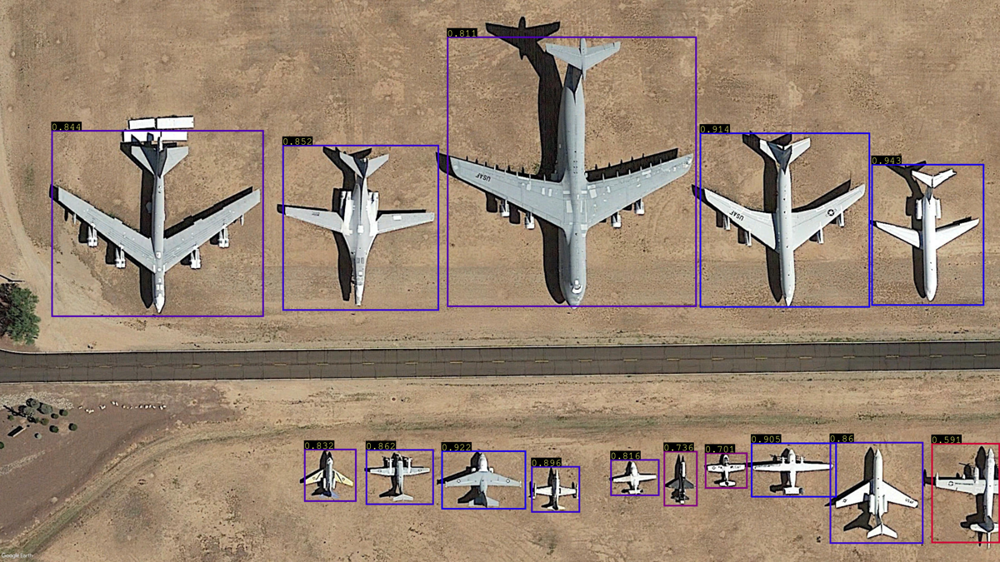

Result : inference_test/results/detr_inference/preds/inptest.json


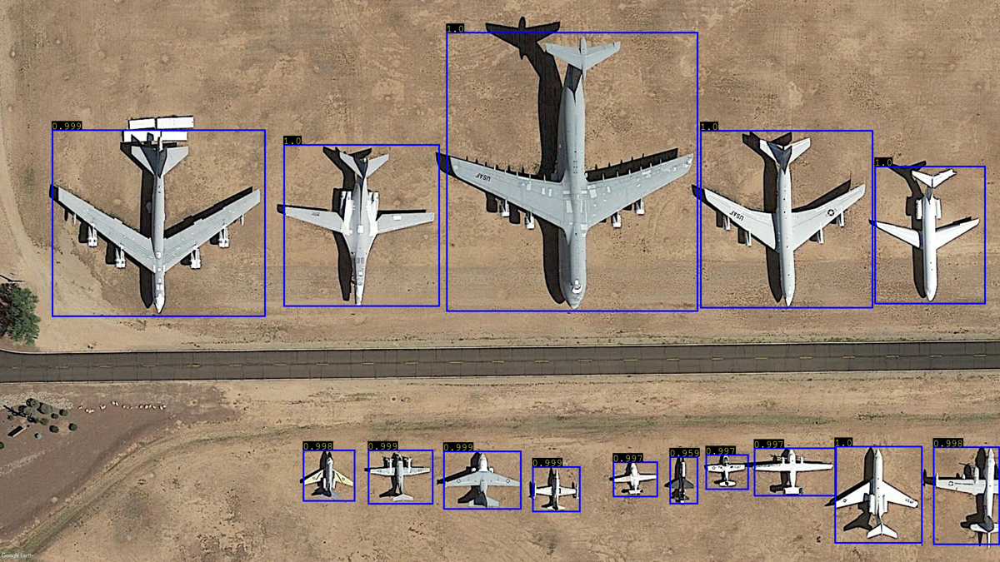

Result : inference_test/results/fasterrcnn_inference/preds/inptest.json


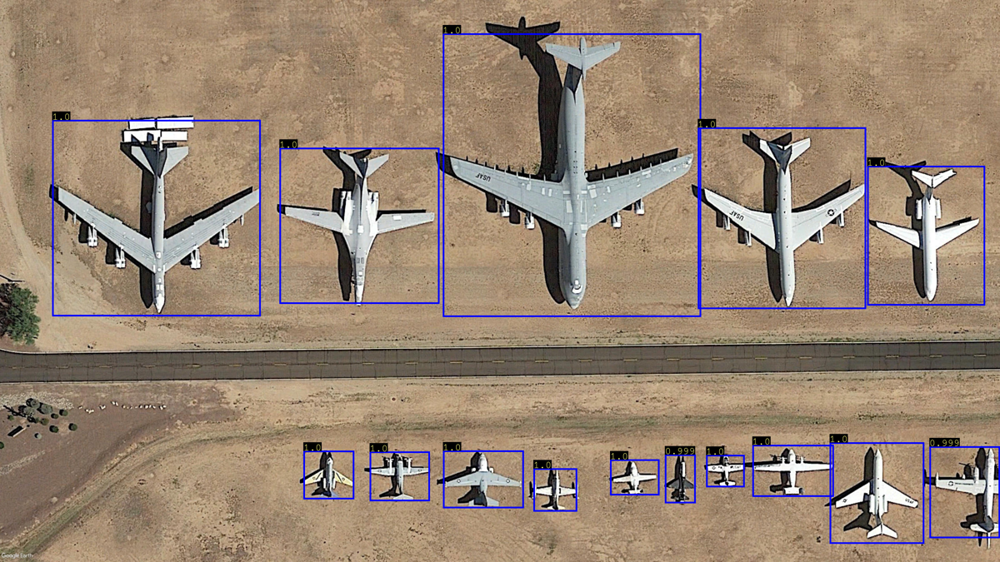

Result : inference_test/results/retinanet_inference/preds/inptest.json


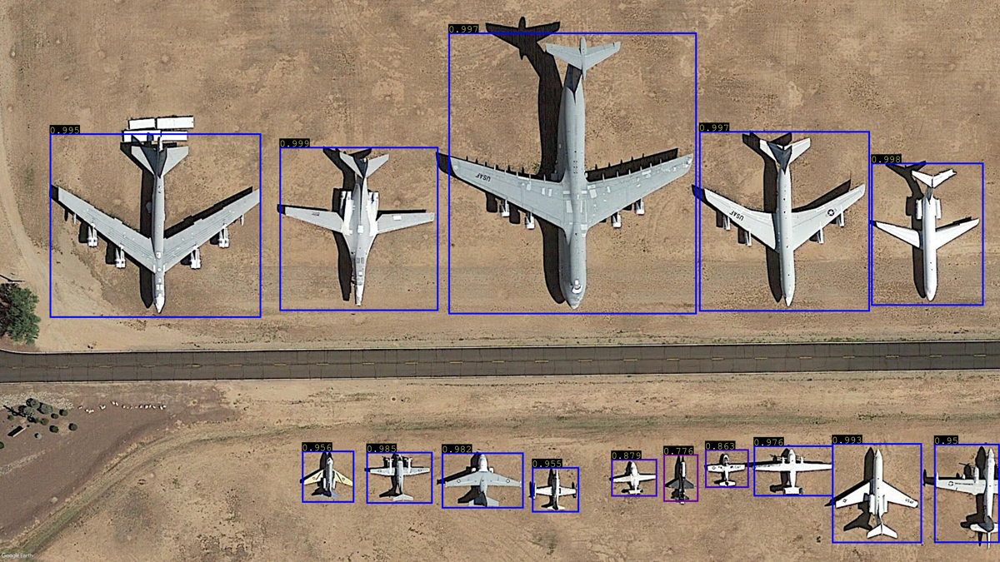

Result : inference_test/results/rtmdet_inference/preds/inptest.json


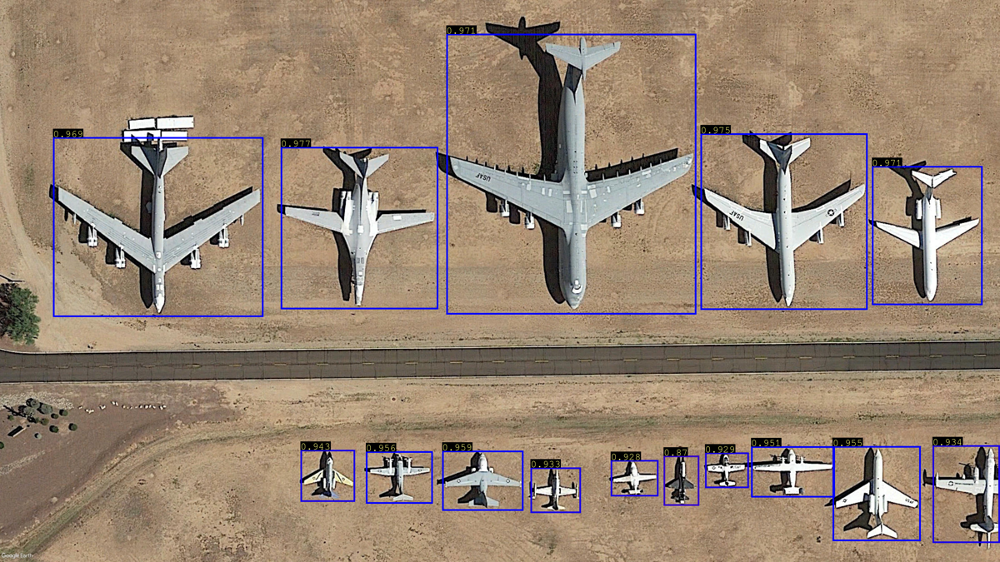

Result : inference_test/results/ssd_inference/preds/inptest.json


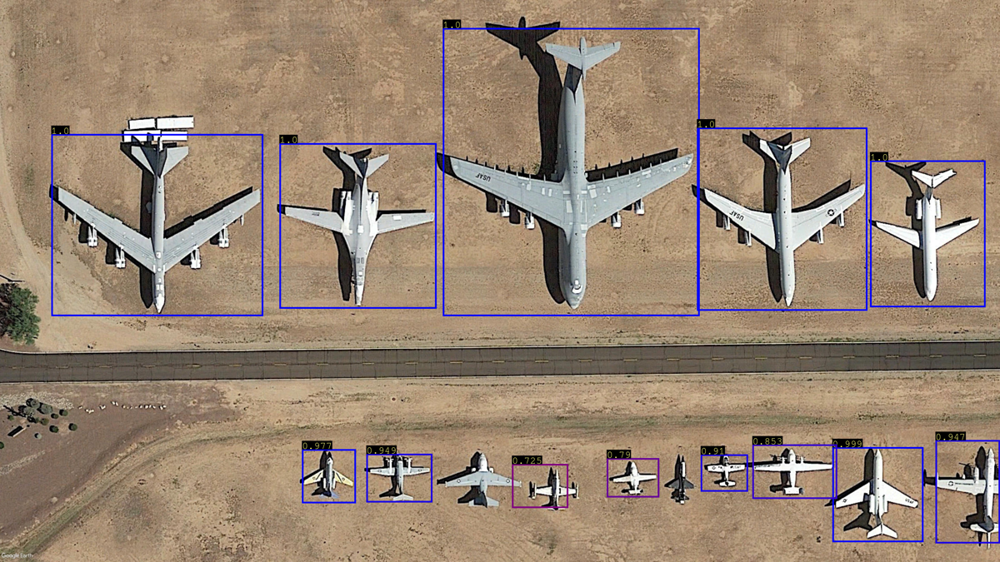

Result : inference_test/results/yolov5_inference/predict9/labels/inptest.txt


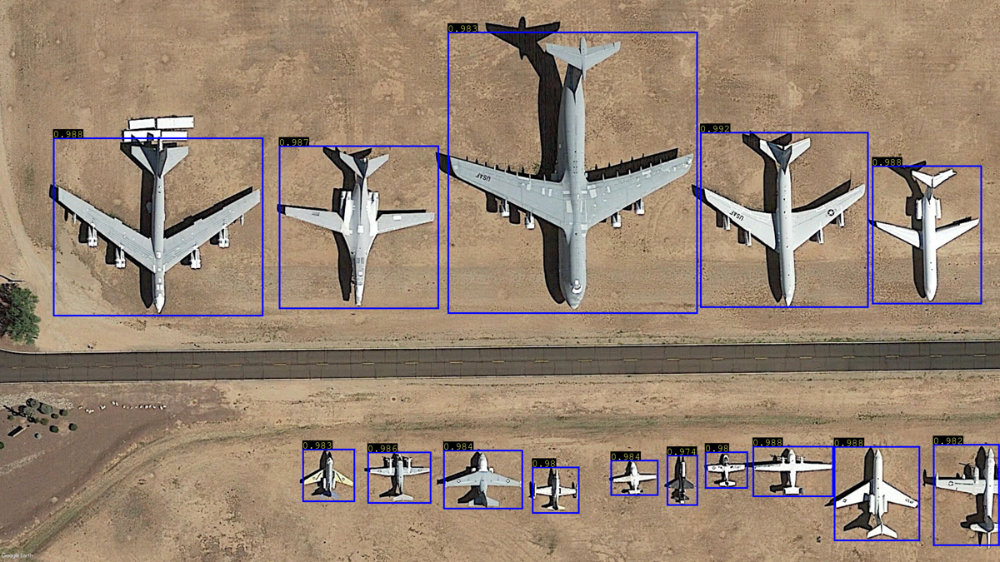

Result : inference_test/results/yolov8_inference/predict6/labels/inptest.txt


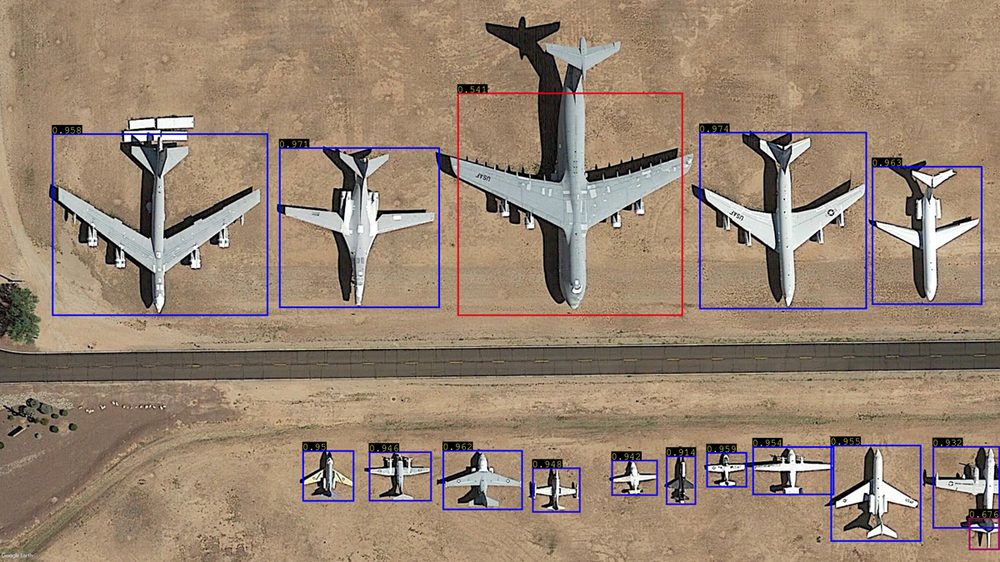

In [39]:
folder_path = "./inference_test/results/"
image_path= "inptest.jpg"

#annot style
txt_color=(255, 255, 255)
yellow=(255, 255, 128)
black = (0, 0, 0)
lw=8
font = ImageFont.truetype(font="Pillow/Tests/fonts/FreeMono.ttf", size=48)

for model in sorted([f.name for f in os.scandir(folder_path) if f.is_dir()]):

    im = Image.open(image_path)
    width, height = im.size
    imdraw = ImageDraw.Draw(im)

    exps = sorted(glob(f"inference_test/results/{model}/*", recursive = True))

    if model[:4] == "yolo":
        annot_file = glob(f"{exps[-1]}/labels/" + "*.txt")[0]
        print("Result : " + annot_file)
        segments, confs = process_txtfile(annot_file)
        
    else:
        annot_file = glob(f"{exps[0]}/{image_path[:-4]}.json")[0]
        print("Result : " + annot_file)
        segments, confs = process_jsonfile(annot_file)

    for conf, box in  zip(confs, segments): 
        conf_r = round(float(conf), 3) # round conf

        if conf_r >= 0.5: # 0.5 threshold
            bbox_c = palette[1] #
            if conf_r <= 1.0: bbox_c = palette[-1]
            if conf_r < 0.95: bbox_c = palette[-2]
            if conf_r < 0.90: bbox_c = palette[-3]
            if conf_r < 0.85: bbox_c = palette[-4]
            if conf_r < 0.80: bbox_c = palette[-5]
            if conf_r < 0.75: bbox_c = palette[-6]
            if conf_r < 0.70: bbox_c = palette[-7]
            if conf_r < 0.65: bbox_c = palette[-8]
            if conf_r < 0.60: bbox_c = palette[-9]
            if conf_r < 0.55: bbox_c = palette[-10]

            if model[:4] == "yolo": 
                box = [box[0]*width, box[1]*height, box[2]*width, box[3]*height]
            imdraw.rectangle(box, width=8, outline=bbox_c)  # box

            # label
            w, h = font.getbbox(str(conf_r))[2:4] # text w, h
            imdraw.rectangle([box[0], box[1]-h, box[0]+w+1, box[1]+1], width=3, fill = black)  # box
            imdraw.text([box[0], box[1]-h], str(conf_r), fill=yellow, font=font)

    im.save(f"{folder_path}{model}/clean.jpg")
    display(im.resize((int(im.width/4), int(im.height/4))))

